# Computer vision and Machine learning - Vehicle Detection Project

In [1]:
# Import required modules 
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
from mpl_toolkits.mplot3d import Axes3D
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from time import time
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

## The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, apply a color transform and append binned color features, as well as histograms of color, to the HOG feature vector.
* Note: for the first two steps it's important to normalize the features and randomize a selection for training and testing.
* Implement a sliding-window technique and use the trained classifier to search for vehicles in images.
* Run the pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

Below I will address each goal / step individually. 

### Histogram of Oriented Gradients (HOG) and classifier training

#### 1. Extraction of HOG features from the training images

In [2]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function for visualizing images (the function borrowed from) the Udacity
# project walkthrough by Ryan 
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i + 1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])    

# To visualize BGR images (ones read via cv2.imread)
def visualize_BGR(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i + 1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(titles[i])  

In [3]:
### Tweak these parameters and see how the results change.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [400, None] # Min and max in y to search in slide_window()

In [4]:
# Define a function to extract features from a single image window
# This function call turn on or off bin_spatial() and color_hist() and HOG features
def single_img_features(img, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'BGR':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
        # feature_image = cv2.cvtColor(image, eval('cv2.COLOR_BGR2' + color_space))
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)

In [5]:
# Define a function to extract features from a list of images
# This function is based on the single_img_features function above
# and processes a list of images as opposed to a single image 
def extract_features(imgs):
    # Create a list to append feature vectors to
    features = []   
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        img = cv2.imread(file)
        # Extract the features of the image
        file_features = single_img_features(img)  
        # Append the features to the list
        features.append(file_features)
    # Return list of feature vectors
    return features

In [6]:
# Read in cars and notcars
cars = []
notcars = []

car_folder_names = ['GTI_Far', 'GTI_Left', 'GTI_MiddleClose', 'GTI_Right']
for name in car_folder_names: 
    image_names = glob.glob('./vehicles/' + name + '/*.png')
    for image_name in image_names:
        cars.append(image_name)

image_names =  glob.glob('./vehicles/KITTI_extracted/*.png')
for image_name in image_names:
    cars.append(image_name)

image_names = glob.glob('./non-vehicles/GTI/*.png')
for image_name in image_names:
    notcars.append(image_name)
    
image_names = glob.glob('./non-vehicles/Extras/*.png')
for image_name in image_names:
    notcars.append(image_name)
    
print(len(cars))
print(len(notcars))

8792
8968


In [35]:
# Generate a random index to look at a car or non-car image
indcar = np.random.randint(0, len(cars))
# Read in the image
image_car = cv2.imread(cars[indcar])
# cv2.imwrite('output_images/sample_car.jpg', image_car)

indnotcar = np.random.randint(0, len(notcars))
# Read in the image
image_notcar = cv2.imread(notcars[indnotcar])
# cv2.imwrite('output_images/sample_notcar.jpg', image_notcar)

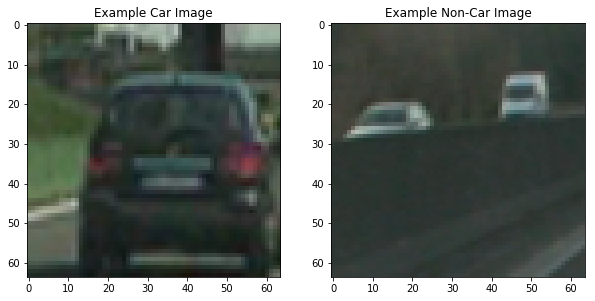

In [36]:
fig = plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.imshow(cv2.cvtColor(image_car, cv2.COLOR_BGR2RGB))
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(cv2.cvtColor(image_notcar, cv2.COLOR_BGR2RGB))
plt.title('Example Non-Car Image')
# plt.savefig('output_images/sample_car_not_car.jpg')

In [37]:
# Extract HOG images
car_features, car_hog_image = get_hog_features(cv2.cvtColor(image_car, cv2.COLOR_BGR2GRAY), 8, 8, 2, 
                                               vis=True, feature_vec=False)
not_car_features, not_car_hog_image = get_hog_features(cv2.cvtColor(image_notcar, cv2.COLOR_BGR2GRAY), 8, 8, 2, 
                                               vis=True, feature_vec=False)

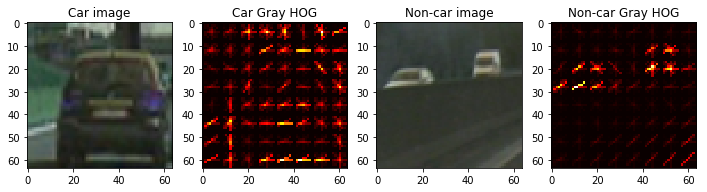

In [38]:
images = [image_car, car_hog_image, image_notcar, not_car_hog_image]
titles = ['Car image', 'Car Gray HOG', 'Non-car image', 'Non-car Gray HOG']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)
# plt.savefig('output_images/car_not_car_HOGs.jpg')

In [21]:
# Extract HOG images
car_features, car_hog_image = get_hog_features(cv2.cvtColor(image_car, cv2.COLOR_BGR2YCrCb)[:,:,1], 8, 8, 2, 
                                               vis=True, feature_vec=False)
not_car_features, not_car_hog_image = get_hog_features(cv2.cvtColor(image_notcar, cv2.COLOR_BGR2YCrCb)[:,:,1], 8, 8, 2, 
                                               vis=True, feature_vec=False)

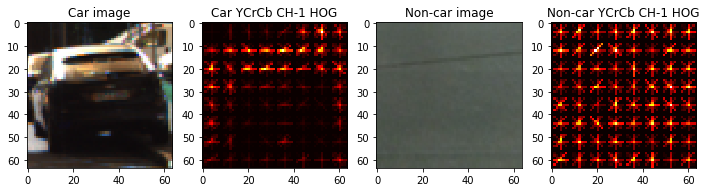

In [22]:
images = [image_car, car_hog_image, image_notcar, not_car_hog_image]
titles = ['Car image', 'Car YCrCb CH-1 HOG', 'Non-car image', 'Non-car YCrCb CH-1 HOG']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)
plt.savefig('output_images/car_not_car_HOGs.jpg')

In [23]:
# Extract HOG images
car_features, car_hog_image = get_hog_features(cv2.cvtColor(image_car, cv2.COLOR_BGR2HSV)[:,:,2], 8, 8, 2, 
                                               vis=True, feature_vec=False)
not_car_features, not_car_hog_image = get_hog_features(cv2.cvtColor(image_notcar, cv2.COLOR_BGR2HSV)[:,:,2], 8, 8, 2, 
                                               vis=True, feature_vec=False)

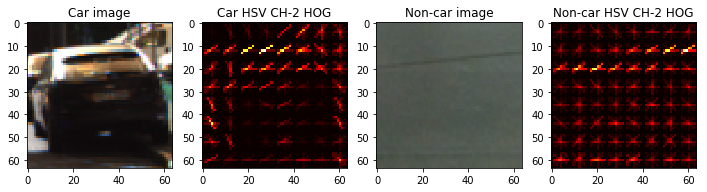

In [24]:
images = [image_car, car_hog_image, image_notcar, not_car_hog_image]
titles = ['Car image', 'Car HSV CH-2 HOG', 'Non-car image', 'Non-car HSV CH-2 HOG']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)
plt.savefig('output_images/car_not_car_HOGs2.jpg')

In [25]:
# Extract HOG images
car_features, car_hog_image = get_hog_features(cv2.cvtColor(image_car, cv2.COLOR_BGR2HLS)[:,:,1], 8, 8, 2, 
                                               vis=True, feature_vec=False)
not_car_features, not_car_hog_image = get_hog_features(cv2.cvtColor(image_notcar, cv2.COLOR_BGR2HLS)[:,:,1], 8, 8, 2, 
                                               vis=True, feature_vec=False)

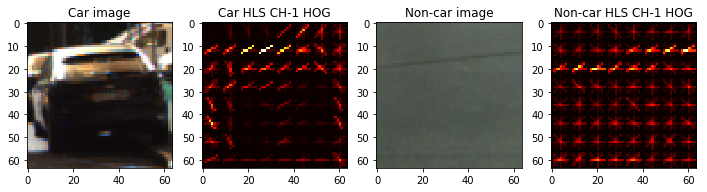

In [26]:
images = [image_car, car_hog_image, image_notcar, not_car_hog_image]
titles = ['Car image', 'Car HLS CH-1 HOG', 'Non-car image', 'Non-car HLS CH-1 HOG']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)
plt.savefig('output_images/car_not_car_HOGs3.jpg')

#### 2. Classifier training

In [7]:
t = time()
# n_samples = 1000
# random_inds_cars = np.random.randint(0, len(cars), n_samples)
# random_inds_notcars = np.random.randint(0, len(notcars), n_samples)
# select_cars = np.array(cars)[random_inds_cars]
# select_notcars = np.array(notcars)[random_inds_notcars]
# car_features = extract_features(select_cars)
# notcar_features = extract_features(select_notcars)

car_features = extract_features(cars)
notcar_features = extract_features(notcars)

print(time() - t, 'Seconds to compute features')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.1, random_state = rand_state)

print('Using:', orient, 'orientations,',pix_per_cell, 'pixels per cell,' ,cell_per_block, 'cells per block,' ,
     'Note: no color histograms and spatial features are used')
print('Feature vector length:', len(X_train[0]))

svc = LinearSVC()
t = time()
svc.fit(X_train, y_train)
print(round(time() - t, 2), 'Seconds to train SVC')
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

100.05732107162476 Seconds to compute features
Using: 9 orientations, 8 pixels per cell, 2 cells per block, Note: no color histograms and spatial features are used
Feature vector length: 6108
18.63 Seconds to train SVC
Test Accuracy of SVC =  0.9932


## Sliding window search

In [8]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

0 255
3.790678024291992 seconds to process one image searching 730 windows
0 255
3.8200020790100098 seconds to process one image searching 730 windows
0 255
3.782144546508789 seconds to process one image searching 730 windows
0 255
3.7959463596343994 seconds to process one image searching 730 windows
0 255
3.8033833503723145 seconds to process one image searching 730 windows
0 255
3.765085220336914 seconds to process one image searching 730 windows


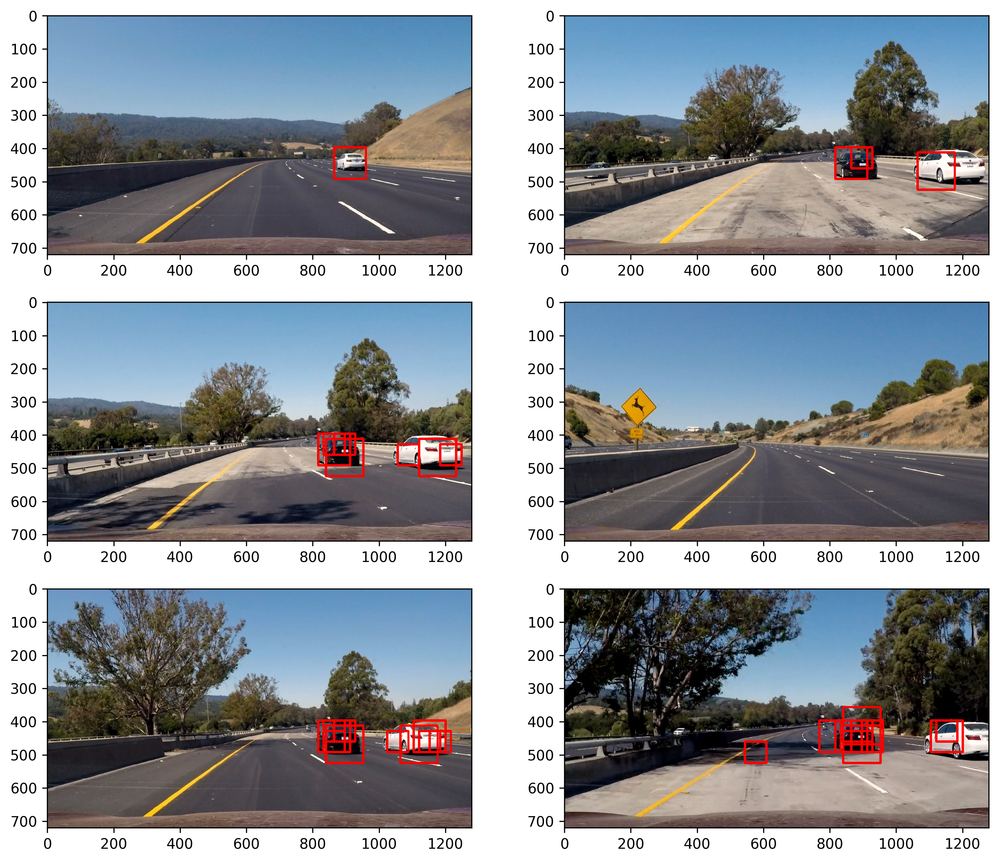

In [110]:
# Applying sliding window search to test images
example_images = glob.glob('./test_images/*')
images = []
titles = []
y_start_stop = [300, 700]
overlap = 0.5
for img_name in example_images:
    t1 = time()
    img = cv2.imread(img_name)
    draw_img = np.copy(img)
    print(np.min(img), np.max(img))
    windows1 = slide_window(img, x_start_stop = [None, None], y_start_stop=y_start_stop, xy_window=(112, 112), 
                          xy_overlap=(overlap, overlap))
    windows2 = slide_window(img, x_start_stop = [None, None], y_start_stop=y_start_stop, xy_window=(96, 96), 
                          xy_overlap=(overlap, overlap))    
    windows3 = slide_window(img, x_start_stop = [None, None], y_start_stop=y_start_stop, xy_window=(64, 64), 
                          xy_overlap=(overlap, overlap)) 
    windows = windows1 + windows2 + windows3
    hot_windows = search_windows(img, windows, svc, X_scaler)

    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time() - t1, 'seconds to process one image searching', len(windows), 'windows')
fig = plt.figure(figsize=(12, 18), dpi=300)
visualize_BGR(fig, 5, 2, images, titles)
plt.savefig('output_images/sliding_window_search.jpg')

## HOG sub-sampling window search

In [9]:
# Define a function for color space conversion 
def convert_color(img, conv='BGR2YCrCb'):
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2LUV':
        return cv2.cvtColor(img, cv2.COLOR_BGR2LUV)    

0.6707348823547363 seconds to run, total windows = 830
0.6894869804382324 seconds to run, total windows = 830
0.695819616317749 seconds to run, total windows = 830
0.6867430210113525 seconds to run, total windows = 830
0.687190055847168 seconds to run, total windows = 830
0.6862220764160156 seconds to run, total windows = 830


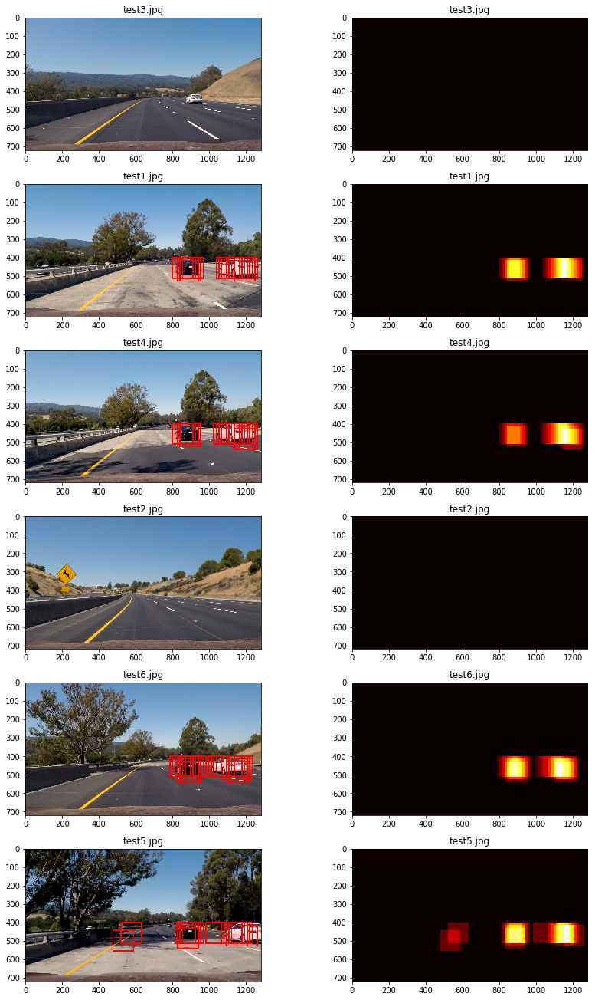

In [115]:
# Implementing HOG sub-sampling window search 
out_images = []
out_maps = []
out_titles = []
out_boxes = []

ystart = 400
ystop = 656
scale = 1.75

# Iterate over test images

for img_name in example_images:
      
    img_boxes = []
    t = time()
    count = 0 
    img = cv2.imread(img_name)
    draw_img = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0])
    #img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='BGR2LUV')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 1  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction 
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
    print(time() - t, 'seconds to run, total windows =', count)
    
    out_images.append(draw_img)
    out_titles.append(img_name[-9:])
    out_titles.append(img_name[-9:])
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)

fig = plt.figure(figsize=(12,24))
visualize_BGR(fig, 8, 2, out_images, out_titles)
plt.tight_layout()
plt.savefig('output_images/HOG_subsampling_search.jpg')

In [16]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, scale, cells_per_step, ystart = 350, ystop = 700):
    
    draw_img = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0])
    #img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='BGR2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    # cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                # img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
    return draw_img, heatmap

## Thresholding to remove false positives and label vehicles

In [17]:
# Define a function to eliminate 'thin' detections
# in the heatmap
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

# Define a function to identify and mark individual vehicles 
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

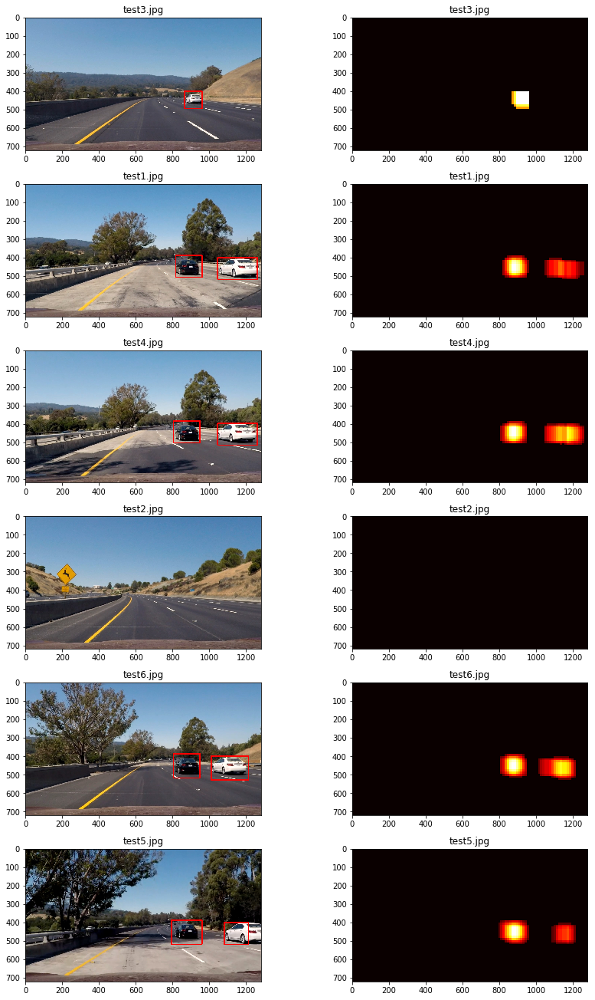

In [119]:
# Applying the heatmap thresholding and individual 
# vehicle marking to test images 
out_images = []
#out_maps = []
scale = 1.5
heatmap_threshold = 2
cells_per_step = 1

# Iterate over test images
for img_name in example_images:
    img = cv2.imread(img_name)
    out_img, heat_map = find_cars(img, scale, cells_per_step)
    labels = label(apply_threshold(heat_map, heatmap_threshold))
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    out_images.append(draw_img)
    out_images.append(heat_map)

fig = plt.figure(figsize=(12, 24))
visualize_BGR(fig, 8, 2, out_images, out_titles)
plt.tight_layout()
plt.savefig('output_images/labels_thresholded_heatmap.jpg')

## Video implementation

In [12]:
# Define a basic pipeline for video processing 
# based on procedures defined in previous sections 
scale = 1.5
heatmap_threshold = 2
cells_per_step = 1

def process_image(img):
    out_img, heat_map = find_cars(img, scale, cells_per_step)
    labels = label(apply_threshold(heat_map, heatmap_threshold))
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [18]:
# Add to the pipeline a heatmap which sums up values of the 
# latest 12 frames for smoothing output 
# This implementation was borrowed from Steward DeSoto
# of Udacity Forums 
heatmaps = []
heatmap_sum = np.zeros((720,1280)).astype(np.float64)

scale = 1.5
heatmap_threshold = 5
cells_per_step = 1

def process_image(img):
    out_img, heat_map = find_cars(img, scale, cells_per_step)
    
    global heatmap_sum
    
    heatmap_sum = heatmap_sum + heat_map
    heatmaps.append(heat_map)
    
    if len(heatmaps)>12:
        old_heatmap = heatmaps.pop(0)
        heatmap_sum -= old_heatmap
        # heatmap_sum = np.clip(heatmap_sum,0.0,1000000.0)
    final_heatmap = apply_threshold(heatmap_sum, heatmap_threshold)
    labels = label(final_heatmap)
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [19]:
output_video = 'project_video_output.mp4'
clip1 = VideoFileClip('project_video.mp4')
basic_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time basic_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [35:22<00:01,  1.67s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 36min 6s, sys: 2.31 s, total: 36min 9s
Wall time: 35min 23s


In [81]:
# To play video in the notebook
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))